In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from tqdm import tqdm_notebook
import scipy.stats as sstats
import math

import seaborn as sns
from sklearn import datasets
from sklearn.model_selection import train_test_split,KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn import tree
import graphviz 
import copy

# Zadanie 1

## KNN
a) Napisz własny klasyfikator K-Nearest Neighbours (KNN). Zadanie można wykonać w Matlabie,
Pythonie lub innym języku programowania. W zadaniu można użyć wcześniej zaimplementowanej
funkcji liczenia odległości (na przykład z zadania 0 z listy 3).

In [2]:
def KNN(train_X, train_Y, test_X, ks, verbose=False):
    """
    Compute predictions for various k
    Args:
        train_X: array of shape Ntrain x D
        train_Y: array of shape Ntrain
        test_X: array of shape Ntest x D
        ks: list of integers
    Returns:
        preds: dict k: predictions for k
    """
    # Cats data to float32
    train_X = train_X.astype(np.float32)
    test_X = test_X.astype(np.float32)

    # Alloc space for results
    preds = {}

    if verbose:
        print("Computing distances... ", end='')

    dists = -2 * np.dot(test_X, train_X.T) + np.sum(train_X**2,axis=1) + np.sum(test_X**2, axis=1)[:, np.newaxis]
    
    if verbose:
        print("Sorting... ", end='')
    
    closest = dists.argsort()

    if verbose:
        print("Computing predictions...", end='')
    
    targets = train_Y[closest]

    for k in ks:
        predictions = sstats.mode(targets[:,:k],axis=1)[0]
        predictions = predictions.ravel()
        preds[k] = predictions
    if verbose:
        print("Done")
    return preds

## KNN for Iris dataset
b) Napisany klasyfikator KNN przetestuj na danych IRIS. Podziel dane losowo na dwie części: 100
wektorów danych użyj jako dane uczące do stworzenia klasyfikatora i 50 wektorów danych użyj
jako dane testowe do przetestowania stworzonego klasyfikatora. Powtórz ten eksperyment
kilkukrotnie i porównaj wyniki.

In [3]:
iris_url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/iris/iris.data'
iris_df = pd.read_csv(iris_url,header=None)

# Set the column names to
# 'sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'target'
iris_df.columns = ['sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'target']

# Print the first 10 entries
iris_df.head(10)

,sepal_length,sepal_width,petal_length,petal_width,target
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa
5,5.4,3.9,1.7,0.4,Iris-setosa
6,4.6,3.4,1.4,0.3,Iris-setosa
7,5.0,3.4,1.5,0.2,Iris-setosa
8,4.4,2.9,1.4,0.2,Iris-setosa
9,4.9,3.1,1.5,0.1,Iris-setosa


In [54]:
def err_rates(preds, test_Y):
    ret = {}
    for k, preds_k in  preds.items():
        # TODO: fill in error count computation
        ret[k] = np.sum(preds_k != test_Y)/test_Y.shape[0]
    return ret

In [55]:
def err_amount(preds, test_Y):
    ret = {}
    for k, preds_k in  preds.items():
        # TODO: fill in error count computation
        ret[k] = np.sum(preds_k != test_Y)
    return ret

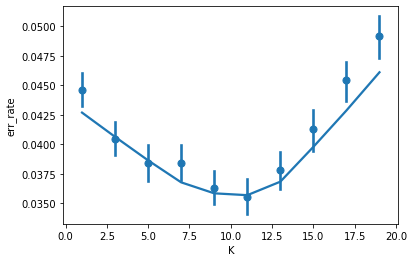

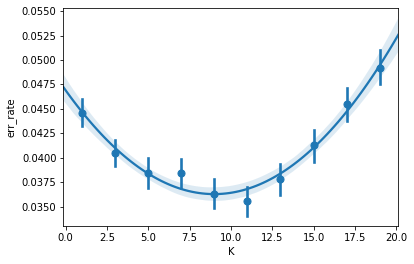

In [6]:
iris_x = np.array(iris_df[['sepal_length', 'sepal_width', 'petal_length', 'petal_width']])
iris_y = np.array(iris_df['target'])

ks = range(1, 20, 2)
results = []
N = iris_y.shape[0]

for _rep in tqdm_notebook(range(1000)):
    # Use np.split and np.permutation to get training and testing indices
    train_idx, test_idx = np.split(np.random.permutation(N),[math.floor(N*0.666)])

    #apply your kNN classifier to data subset
    preds = KNN(iris_x[train_idx],iris_y[train_idx],iris_x[test_idx],ks)
    errs = err_rates(preds, iris_y[test_idx])
    
    for k, errs_k in errs.items():
        results.append({'K':k, 'err_rate': errs_k})

# results_df will be a data_frame in long format
results_df = pd.DataFrame(results)


plt.figure()
sns.regplot(x = "K",y = "err_rate",data=results_df,x_estimator=np.mean, lowess = True)

plt.figure()
sns.regplot(x = "K",y = "err_rate",data=results_df,x_estimator=np.mean, order=2)


## KNN for digits dataset
c) Przeprowadź też podobny test klasyfikatora KNN na danych Optical Recognition of Handwritten
Digits (https://archive.ics.uci.edu/ml/datasets/Optical+Recognition+of+Handwritten+Digits).

In [7]:
from sklearn.datasets import load_digits

In [8]:
digits = load_digits()
digits_df = pd.DataFrame(data = digits.data)
digits_df['target'] = digits.target
digits_df.head()

,0,1,2,3,4,5,6,7,8,9,...,55,56,57,58,59,60,61,62,63,target
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0,0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0,1
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0,2
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0,3
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0,4


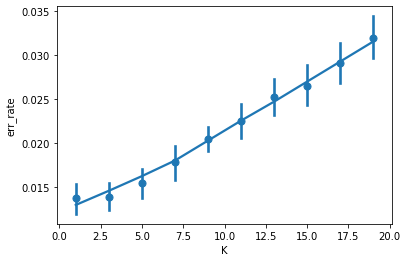

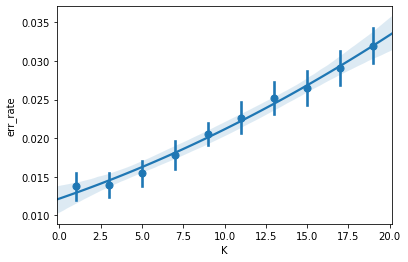

In [9]:
digits_x = np.array(digits.data)
digits_y = np.array(digits.target)

ks = range(1, 20, 2)
results = []
N = digits_y.shape[0]

for _rep in tqdm_notebook(range(25)):
    # Use np.split and np.permutation to get training and testing indices
    train_idx, test_idx = np.split(np.random.permutation(N),[math.floor(N*0.666)])

    #apply your kNN classifier to data subset
    preds = KNN(digits_x[train_idx],digits_y[train_idx],digits_x[test_idx],ks)
    errs = err_rates(preds, digits_y[test_idx])
    
    for k, errs_k in errs.items():
        results.append({'K':k, 'err_rate': errs_k})

# results_df will be a data_frame in long format
results_df = pd.DataFrame(results)


plt.figure()
sns.regplot(x = "K",y = "err_rate",data=results_df,x_estimator=np.mean, lowess = True)

plt.figure()
sns.regplot(x = "K",y = "err_rate",data=results_df,x_estimator=np.mean, order=2)

## Cross validation
d) Zrób cross validation klasyfikatora KNN na obu zestawach danych: podziel dane na 10 części,
kolejno bierz jedną z nich, traktuj ją jako dane testowe, a pozostałe 9 części jako dane uczące,
stwórz klasyfikator na danych uczących i przetestuj na danych testowych, odnotuj liczbę błędów,
powtórz obliczenia dla kolejnych części danych, policz całkowity błąd klasyfikatora sumując
odnotowane liczby błędów.

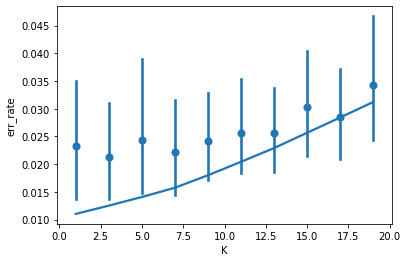

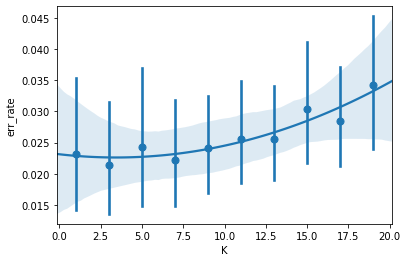

In [10]:
kf = KFold(n_splits = 10,shuffle = True)

ks = range(1, 20, 2)
errs_ = {}

for train_idx,test_idx in kf.split(iris_df):
    preds = KNN(iris_x[train_idx],iris_y[train_idx],iris_x[test_idx],ks)
    errs = err_rates(preds, iris_y[test_idx])
    errs_a = err_amount(preds, iris_y[test_idx])
    
    for k, errs_k in errs.items():
        results.append({'K':k, 'err_rate': errs_k})
        
    for k,err_a in errs_a.items():
        errs_[k] = errs_.get(k,0) + err_a
        
        
# results_df will be a data_frame in long format
results_df = pd.DataFrame(results)

plt.figure()
sns.regplot(x = "K",y = "err_rate",data=results_df,x_estimator=np.mean, lowess = True)

plt.figure()
sns.regplot(x = "K",y = "err_rate",data=results_df,x_estimator=np.mean, order=2)

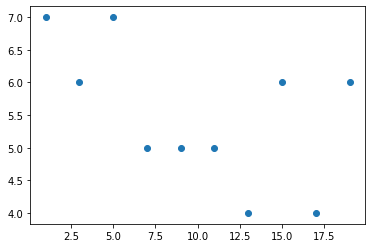

In [11]:
plt.scatter(list(errs_.keys()),list(errs_.values()))

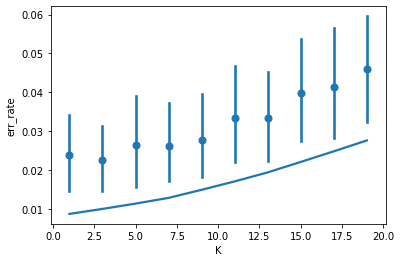

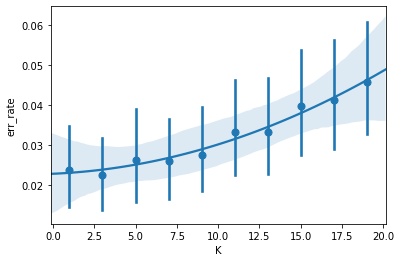

In [12]:
kf = KFold(n_splits = 10,shuffle = True)

ks = range(1, 20, 2)

errs_ = {}
for train_idx,test_idx in kf.split(iris_df):
    preds = KNN(digits_x[train_idx],digits_y[train_idx],digits_x[test_idx],ks)
    errs = err_rates(preds, digits_y[test_idx])
    errs_a = err_amount(preds, digits_y[test_idx])
    
    for k, errs_k in errs.items():
        results.append({'K':k, 'err_rate': errs_k})
        
    for k,err_a in errs_a.items():
        errs_[k] = errs_.get(k,0) + err_a
        
# results_df will be a data_frame in long format
results_df = pd.DataFrame(results)

plt.figure()
sns.regplot(x = "K",y = "err_rate",data=results_df,x_estimator=np.mean, lowess = True)

plt.figure()
sns.regplot(x = "K",y = "err_rate",data=results_df,x_estimator=np.mean, order=2)

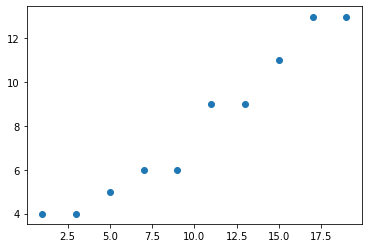

In [13]:
plt.scatter(list(errs_.keys()),list(errs_.values()))

# Zadanie 2
W pakiecie SciKit do Pythona dostępnych jest kilka popularnych algorytmów klasyfikacji danych
przy użyciu drzew klasyfikacyjnych. Zapoznaj się z nimi wykonując skrypt umieszczony w
materiałach do wykładu. Do rysowania drzew użyj programu Graphviz.

In [14]:
iris_tree = tree.DecisionTreeClassifier(random_state=0)
iris = datasets.load_iris()
iris_tree.fit(iris.data,iris.target)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=0, splitter='best')

In [15]:
def draw_tree(tree_,feature_names,target_names):
    dot_data = tree.export_graphviz(tree_, out_file=None) 
    graph = graphviz.Source(dot_data) 
    graph.render("iris") 
    dot_data = tree.export_graphviz(tree_, out_file=None, 
                     feature_names=feature_names,  
                     class_names=target_names,  
                     filled=True, rounded=True,  
                     special_characters=True)  
    graph = graphviz.Source(dot_data)  
    return graph 

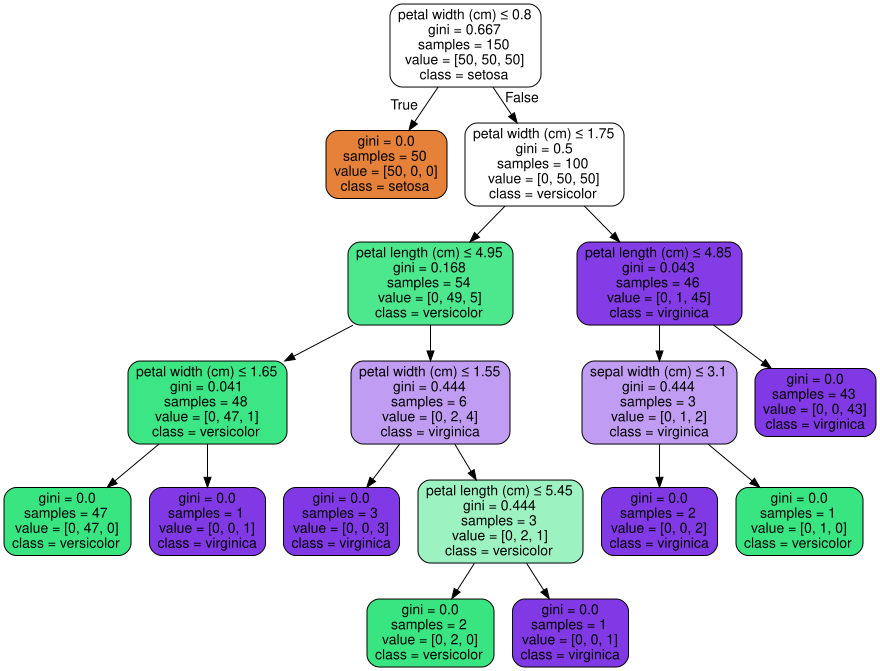

In [16]:
draw_tree(iris_tree,iris.feature_names,iris.target_names)

## Miara różnorodności
a) Jaką miarę różnorodności stosuje algorytm konstrukcji drzew klasyfikujących użyty w skrypcie?
Dla danych Titanic sporządź drzewa klasyfikacyjne stosując indeks Giniego oraz entropię.

In [17]:
titanic_df = pd.read_csv("train.csv")
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [18]:
titanic_df = titanic_df.drop(['PassengerId', 'Name', 'Ticket', 'Cabin'], axis = 1)
titanic_df = titanic_df.dropna()
titanic_df['Sex'] = titanic_df['Sex'].astype('category')
titanic_df['Sex'] = titanic_df['Sex'].cat.codes
titanic_df['Embarked'] = titanic_df['Embarked'].astype('category')
titanic_df['Embarked'] = titanic_df['Embarked'].cat.codes
titanic_df.head()

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,0,3,1,22.0,1,0,7.2500,2
1,1,1,0,38.0,1,0,71.2833,0
2,1,3,0,26.0,0,0,7.9250,2
3,1,1,0,35.0,1,0,53.1000,2
4,0,3,1,35.0,0,0,8.0500,2


In [19]:
titanic_Y = np.array(titanic_df['Survived'])
titanic_X = np.array(titanic_df.drop('Survived', axis = 1))

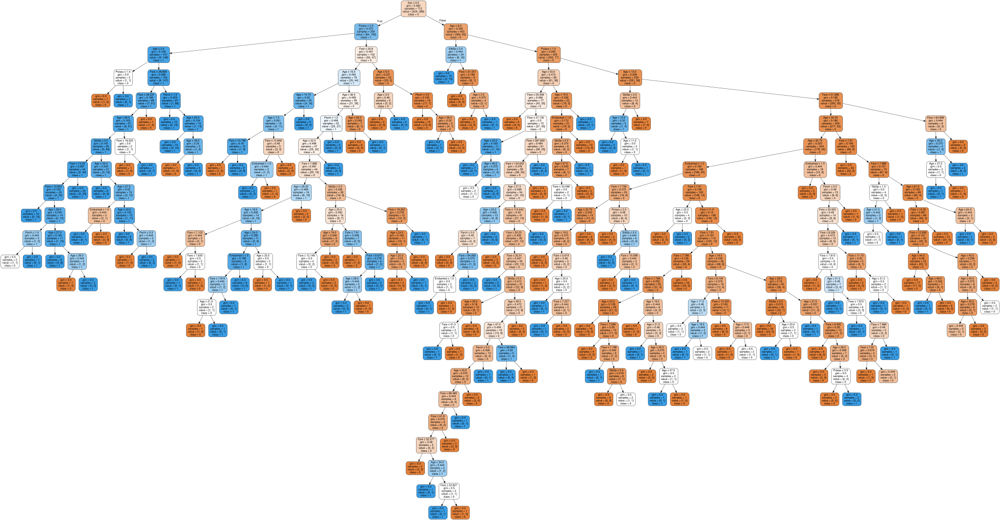

In [20]:
titanic_gini_tree = tree.DecisionTreeClassifier(criterion = 'gini',random_state=0)
titanic_gini_tree.fit(titanic_X,titanic_Y)
draw_tree(titanic_gini_tree,['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked'],['0','1'])

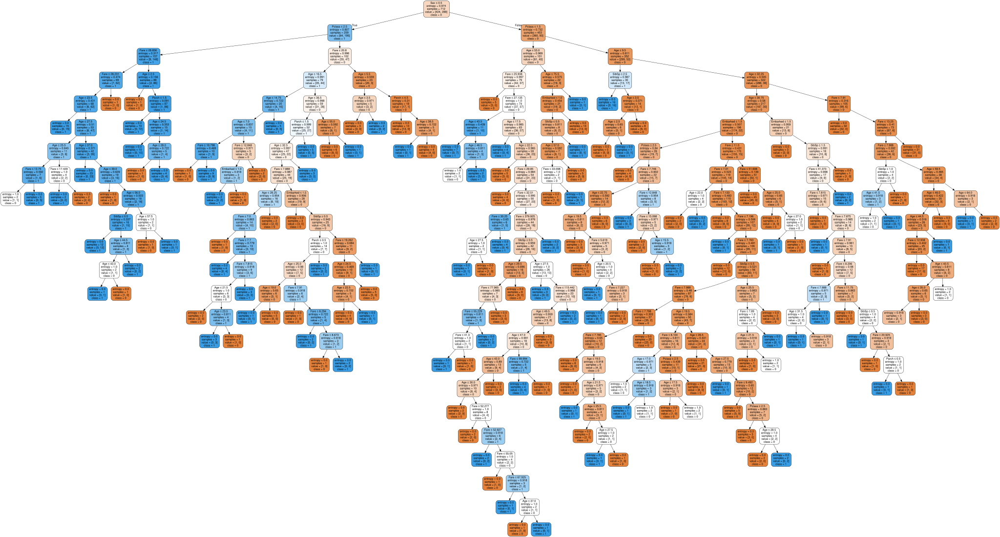

In [21]:
titanic_entropy_tree = tree.DecisionTreeClassifier(criterion = 'entropy',random_state=0)
titanic_entropy_tree.fit(titanic_X,titanic_Y)
draw_tree(titanic_entropy_tree,['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked'],['0','1'])

## Decistion tree for Titanic dataset
b) Podziel dane Titanic na dane uczące i dane testowe (jak w zadaniu 1b), stwórz drzewa
klasyfikacyjne na danych uczących i przetestuj na danych testowych. 

In [22]:
N = titanic_Y.shape[0]
train_idx, test_idx = np.split(np.random.permutation(N),[math.floor(N*0.666)])

In [23]:
titanic_X_train = titanic_X[train_idx]
titanic_X_test = titanic_X[test_idx]
titanic_Y_train = titanic_Y[train_idx]
titanic_Y_test = titanic_Y[test_idx]

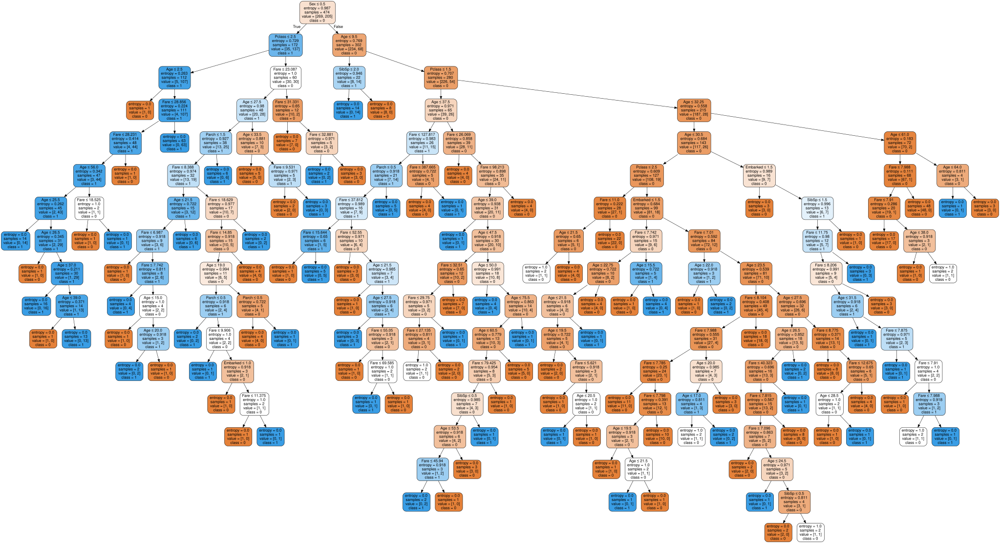

In [24]:
titanic_test_tree = tree.DecisionTreeClassifier(criterion = 'entropy',random_state=0)
titanic_test_tree.fit(titanic_X_train,titanic_Y_train)
draw_tree(titanic_test_tree,['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked'],['0','1'])

In [25]:
titanic_test_tree.score(titanic_X_test,titanic_Y_test)

0.7563025210084033

## Depth reduce
c) Spróbuj ograniczyć głębokość drzewa. Zobacz jak wpływa to na wyniki (zarówno na danych
uczących jak i na danych testowych).

In [26]:
for i in range(1,16):
    titanic_test_tree_ = tree.DecisionTreeClassifier(criterion = 'entropy',random_state=0,max_depth=i)
    titanic_test_tree_.fit(titanic_X_train,titanic_Y_train)
    print(f"Max depth = {i},score on train: {titanic_test_tree_.score(titanic_X_train,titanic_Y_train)}, score on test: {titanic_test_tree_.score(titanic_X_test,titanic_Y_test)}")


Max depth = 1,score on train: 0.7827004219409283, score on test: 0.773109243697479
Max depth = 2,score on train: 0.7953586497890295, score on test: 0.8067226890756303
Max depth = 3,score on train: 0.8312236286919831, score on test: 0.8151260504201681
Max depth = 4,score on train: 0.8481012658227848, score on test: 0.819327731092437
Max depth = 5,score on train: 0.8628691983122363, score on test: 0.7983193277310925
Max depth = 6,score on train: 0.879746835443038, score on test: 0.7857142857142857
Max depth = 7,score on train: 0.8945147679324894, score on test: 0.7983193277310925
Max depth = 8,score on train: 0.9135021097046413, score on test: 0.7815126050420168
Max depth = 9,score on train: 0.9388185654008439, score on test: 0.7815126050420168
Max depth = 10,score on train: 0.9514767932489452, score on test: 0.773109243697479
Max depth = 11,score on train: 0.959915611814346, score on test: 0.7773109243697479
Max depth = 12,score on train: 0.9704641350210971, score on test: 0.76050420168

## Pruning
d) Spróbuj przyciąć drzewo techniką omawianą na wykładzie lub własną. Zobacz jak wpływa to na
wyniki (zarówno na danych uczących jak i na danych testowych).

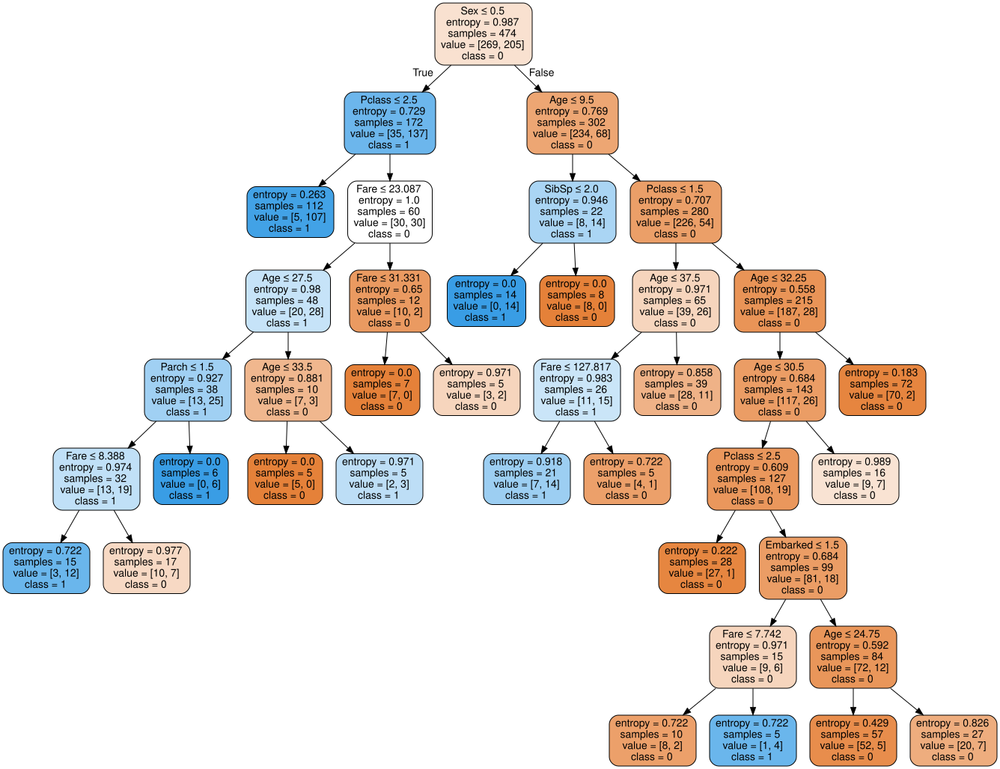

In [27]:
titanic_pruned_tree = tree.DecisionTreeClassifier(criterion = 'entropy',random_state=0,max_depth = 8,min_samples_split = 8,min_samples_leaf=5,max_leaf_nodes=20)
titanic_pruned_tree.fit(titanic_X_train,titanic_Y_train)
draw_tree(titanic_pruned_tree,['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked'],['0','1'])

In [28]:
titanic_pruned_tree.score(titanic_X_test,titanic_Y_test)

0.7899159663865546

## Cross validation
e) Zrób cross validation wszystkich tworzonych w tym zadaniu klasyfikatorów na zestawie danych
Titanic.

In [29]:
err_gini = 0
err_entropy = 0
err_gini_max8 = 0
err_entropy_max8 = 0
err_gini_pruned = 0
err_entrop_pruned = 0
for train_idx,test_idx in kf.split(titanic_df):
    tree_gini = tree.DecisionTreeClassifier(criterion = 'gini',random_state=0)
    tree_gini.fit(titanic_X[train_idx],titanic_Y[train_idx])
    tree_entropy = tree.DecisionTreeClassifier(criterion = 'entropy',random_state=0)
    tree_entropy.fit(titanic_X[train_idx],titanic_Y[train_idx])
    tree_gini_max8 = tree.DecisionTreeClassifier(criterion = 'gini',random_state=0,max_depth = 8)
    tree_gini_max8.fit(titanic_X[train_idx],titanic_Y[train_idx])
    tree_entropy_max8 = tree.DecisionTreeClassifier(criterion = 'entropy',random_state=0,max_depth=8)
    tree_entropy_max8.fit(titanic_X[train_idx],titanic_Y[train_idx])
    tree_gini_pruned = tree.DecisionTreeClassifier(criterion = 'gini',random_state=0,max_depth = 8,min_samples_split = 8,min_samples_leaf=5,max_leaf_nodes=20)
    tree_gini_pruned.fit(titanic_X[train_idx],titanic_Y[train_idx])
    tree_entrop_pruned = tree.DecisionTreeClassifier(criterion = 'entropy',random_state=0,max_depth = 8,min_samples_split = 8,min_samples_leaf=5,max_leaf_nodes=20)
    tree_entrop_pruned.fit(titanic_X[train_idx],titanic_Y[train_idx])
    N = titanic_X[train_idx].shape[0]
    err_gini += N - round(tree_gini.score(titanic_X[test_idx],titanic_Y[test_idx]) * N)
    err_entropy += N - round(tree_entropy.score(titanic_X[test_idx],titanic_Y[test_idx]) * N)
    err_gini_max8 += N - round(tree_gini_max8.score(titanic_X[test_idx],titanic_Y[test_idx]) * N)
    err_entropy_max8 += N - round(tree_entropy_max8.score(titanic_X[test_idx],titanic_Y[test_idx]) * N)
    err_gini_pruned += N - round(tree_gini_pruned.score(titanic_X[test_idx],titanic_Y[test_idx]) * N)
    err_entrop_pruned += N - round(tree_entrop_pruned.score(titanic_X[test_idx],titanic_Y[test_idx]) * N)

In [30]:
print(f"Criterion = gini, missclass: {err_gini}")
print(f"Criterion = entropy, missclass: {err_entropy}")
print(f"Criterion = gini, max_depth = 8, missclass: {err_gini_max8}")
print(f"Criterion = entropy, max_depth = 8, missclass: {err_entropy_max8}")
print(f"Criterion = gini, pruned, missclass: {err_gini_pruned}")
print(f"Criterion = entropy, pruned, missclass: {err_entrop_pruned}")

Criterion = gini, missclass: 1522.0
Criterion = entropy, missclass: 1550.0
Criterion = gini, max_depth = 8, missclass: 1305.0
Criterion = entropy, max_depth = 8, missclass: 1356.0
Criterion = gini, pruned, missclass: 1221.0
Criterion = entropy, pruned, missclass: 1177.0


# Zadanie 3
Zapoznaj się z implementacją algorytmów Random Forest i Extremely Randomized Trees w
pakiecie SciKit (http://scikit-learn.org/stable/modules/ensemble.html#forest). Użyj ich do klasyfikacji
danych IRIS oraz Titanic. Oceń ich skuteczność dzieląc dane na dwa zestawy lub robiąc cross
validation. 

### Iris

In [31]:
iris_X = np.array(iris_df[['sepal_length', 'sepal_width', 'petal_length', 'petal_width']])
iris_Y = np.array(iris_df['target'])
N = iris_Y.shape[0]
train_idx, test_idx = np.split(np.random.permutation(N),[math.floor(N*0.666)])
iris_X_train = iris_X[train_idx]
iris_X_test = iris_X[test_idx]
iris_Y_train = iris_Y[train_idx]
iris_Y_test = iris_Y[test_idx]

In [32]:
iris_RF = RandomForestClassifier(n_estimators=10, max_depth=10, min_samples_split=3, random_state=0)
iris_RF.fit(iris_X_train,iris_Y_train)
print(f"Random forest, max_depth = 10, min_sample_split = 3, n_estimators = 10, score: {iris_RF.score(iris_X_test,iris_Y_test)}")

Random forest, max_depth = 10, min_sample_split = 3, n_estimators = 10, score: 0.9411764705882353


In [33]:
iris_ERT = ExtraTreesClassifier(n_estimators=10, max_depth=10, min_samples_split=3, random_state=0)
iris_ERT.fit(iris_X_train,iris_Y_train)
print(f"Extremely Randomized Trees, max_depth = 10, min_sample_split = 3, n_estimators = 10, score: {iris_ERT.score(iris_X_test,iris_Y_test)}")

Extremely Randomized Trees, max_depth = 10, min_sample_split = 3, n_estimators = 10, score: 0.9215686274509803


### Titanic

In [34]:
titanic_Y = np.array(titanic_df['Survived'])
titanic_X = np.array(titanic_df.drop('Survived', axis = 1))
N = titanic_Y.shape[0]
train_idx, test_idx = np.split(np.random.permutation(N),[math.floor(N*0.666)])
titanic_X_train = titanic_X[train_idx]
titanic_X_test = titanic_X[test_idx]
titanic_Y_train = titanic_Y[train_idx]
titanic_Y_test = titanic_Y[test_idx]

In [35]:
titanic_RF = RandomForestClassifier(n_estimators=50, max_depth=10, min_samples_split=3, random_state=0)
titanic_RF.fit(titanic_X_train,titanic_Y_train)
print(f"Random forest, max_depth = 10, min_sample_split = 3, n_estimators = 50, score: {titanic_RF.score(titanic_X_test,titanic_Y_test)}")

Random forest, max_depth = 10, min_sample_split = 3, n_estimators = 50, score: 0.819327731092437


In [36]:
titanic_ERT = ExtraTreesClassifier(n_estimators=100, max_depth=8, min_samples_split=10, random_state=0)
titanic_ERT.fit(titanic_X_train,titanic_Y_train)
print(f"Extremely Randomized Trees, max_depth = 8, min_sample_split = 10, n_estimators = 100, score: {titanic_ERT.score(titanic_X_test,titanic_Y_test)}")

Extremely Randomized Trees, max_depth = 8, min_sample_split = 10, n_estimators = 100, score: 0.8109243697478992


# Decision tree

In [2]:
def entropy(counts):
    s = sum(counts)
    return -sum((counts/s)*np.log2(counts/s + 1e-100))

def gini(counts):
    s = sum(counts)
    return 1 - sum((counts/s)**2)

def mean_err_rate(counts):
    s = sum(counts)
    return 1 - np.max(counts/s)

In [3]:
class AbstractSplit:
    """Split the examples in a tree node according to a criterion.
    """
    def __init__(self, attr):
        self.attr = attr

    def __call__(self, x):
        """Return the subtree corresponding to x."""
        raise NotImplementedError

    def build_subtrees(self, df, subtree_kwargs):
        """Recuisively build the subtrees."""
        raise NotImplementedError

    def iter_subtrees(self):
        """Return an iterator over subtrees."""
        raise NotImplementedError

    def add_to_graphviz(self, dot):
        """Add the split to the graphviz vizluzation."""
        raise NotImplementedError

    def __str__(self):
        return f"{self.__class__.__name__}: {self.attr}"

In [4]:
class CategoricalMultivalueSplit(AbstractSplit):
    def build_subtrees(self, df, subtree_kwargs):
        self.subtrees = {}
        for group_name, group_df in df.groupby(self.attr):
            child = Tree(group_df, **subtree_kwargs)
            self.subtrees[group_name] = child

    def __call__(self, x):
        # Return the subtree for the given example
        if x[self.attr] in self.subtrees:
            return self.subtrees[x[self.attr]]
        return

    def iter_subtrees(self):
        return self.subtrees.values()


    def feed_subtrees_for_rer_pruning(self,new_df):
        for val_of_attr,subtr in self.subtrees.items():
            new_df_for_subt = new_df.loc[lambda df: df[self.attr] == val_of_attr]
            subtr.feed_for_rer_pruning(new_df_for_subt)
        
    
    def add_to_graphviz(self, dot, parent, print_info):
        for split_name, child in self.subtrees.items():
            child.add_to_graphviz(dot, print_info)
            dot.edge(f'{id(parent)}', f'{id(child)}',
                     label=f'{split_name}')

In [5]:
def get_categorical_split_and_purity(df, parent_purity, purity_fun, attr,
                                     normalize_by_split_entropy=False):
    """Return a multivariate split and its purity.
    Args:
        df: a dataframe
        parent_purity: purity of the parent node
        purity_fun: function to compute the purity
        attr: attribute over which to split the dataframe
        normalize_by_split_entropy: if True, divide the purity gain by the split
            entropy (to compute https://en.wikipedia.org/wiki/Information_gain_ratio)
    
    Returns:
        pair of (split, purity_gain)
    """
    split = CategoricalMultivalueSplit(attr)
    # Compute the purity after the split
    # purity = weighted sum of children purity
    purity = 0

    for _,group_df in df.groupby(attr):
        purity += purity_fun(group_df['target'].value_counts()) * len(group_df)
    purity /= len(df)
    purity_gain = parent_purity - purity
    if normalize_by_split_entropy:
        purity_gain /= entropy(df[attr].value_counts())
    return split, purity_gain

In [6]:
def get_split(df, criterion='infogain', nattrs=None):
    # Implement termination criteria:
    # 1. Node is pure
    target_value_counts = df['target'].value_counts()
    if len(target_value_counts) == 1:
        return None
    # 2. No split is possible
    #    First get alist of attributes that can be split
    possible_splits = [e for e in df.columns if e != 'target' and len(df[e].value_counts()) != 1]
    #    Terminate early if none are possivle
    if not possible_splits:
        return None

    if nattrs:
        possible_splits = [possible_splits[i] for i in np.random.choice(len(possible_splits),nattrs)]
    
    # Get the base purity measure and the purity function
    if criterion in ['infogain', 'infogain_ratio']:
        purity_fun = entropy
    elif criterion in ['mean_err_rate']:    
        purity_fun = mean_err_rate
    elif criterion in ['gini']:
        purity_fun = gini
    else:
        raise Exception("Unknown criterion: " + criterion)
    base_purity = purity_fun(target_value_counts)

    best_purity_gain = -1
    best_split = None

    # Random Forest support
    # Randomize the split by restricting the number of attributes
    
    for attr in possible_splits:
        if np.issubdtype(df[attr].dtype, np.number):
            # Handling of numerical attributes will be defined later, in a manner 
            # similar to categorical ones
            split_sel_fun = get_numrical_split_and_purity
        else:
            split_sel_fun = get_categorical_split_and_purity
        
        split, purity_gain = split_sel_fun(
            df, base_purity, purity_fun, attr,
            normalize_by_split_entropy=criterion.endswith('ratio'))
        if purity_gain > best_purity_gain:
            best_purity_gain = purity_gain
            best_split = split
    return best_split

In [7]:
class Tree:
    def __init__(self, df, **kwargs):
        super().__init__()
        # Assert that threre are no missing values, 
        # TODO: remove this for bonus problem #XXX
        assert not df.isnull().values.any()
        
        # We need to let subtrees know about all targets to properly color nodes
        if 'all_targets' not in kwargs:
            kwargs['all_targets'] = sorted(df['target'].unique())
        # Save keyword arguments to build subtrees
        kwargs_orig = dict(kwargs)
        
        # Get kwargs we know about, remaning ones are for splitting
        self.all_targets = kwargs.pop('all_targets')
        
        # Save debug info for visualization
        self.rer_pruning_counts = df['target'].value_counts() * 0
        self.rer_pruning_err_counts = {"good" : 0, "bad" : 0}
        self.rer_pruning_ES = -1
        self.rer_pruning_EL = -1
        self.CI_node_err_rate = -1
        self.CI_subtree_err_rate = -1
        self.counts = df['target'].value_counts()
        self.pruned = False
        self.info = {
            'num_samples': len(df),
            'entropy': entropy(self.counts),
            'gini': gini(self.counts)
        }
        
        self.split = get_split(df, **kwargs)
        if self.split:
            #print('!!S', self.split)
            self.split.build_subtrees(df, kwargs_orig)
    
    def get_target_distribution(self, sample):
        if self.split:
            subt = self.split(sample)
            if subt:
                return subt.get_target_distribution(sample)
            else:
                return self.counts / self.info['num_samples']
        else:
            return self.counts / self.info['num_samples']
        # TODO: descend into subtrees and return the leaf target distribution
        
    def classify(self, sample):
        if self.split:
            subt = self.split(sample)
            if subt:
                return subt.classify(sample)
            else:
                l = [(v,e) for v,e in dict(self.counts).items()]
                return max(l,key = lambda x: x[1])[0]
        else:
            l = [(v,e) for v,e in dict(self.counts).items()]
            return max(l,key = lambda x: x[1])[0]
        # TODO: classify the sample by descending into the appropriate subtrees.

    def pruning_precuting(self,k):
        if self.split:
            if self.info['num_samples'] < k:
                self.split = None  
            else:
                for subt in self.split.iter_subtrees():
                    subt.pruning_precuting(k)

    def reset_rer_pruning(self):
        self.rer_pruning_counts *= 0
        self.rer_pruning_err_counts = {"good" : 0, "bad" : 0}
        if self.split:
            for sb in self.split.iter_subtrees():
                sb.reset_rer_pruning()

    def feed_for_rer_pruning(self,new_df):
        self.rer_pruning_counts = new_df['target'].value_counts()
        if self.split:
            self.split.feed_subtrees_for_rer_pruning(new_df)

    def classify_in_rer_pruning(self,sample):
        l = [(v,e) for v,e in dict(self.rer_pruning_counts).items()]
        if len(l) == 0:
            #self.rer_pruning_err_counts["good"] += 1
            pass
        else:
            new_targ = max(l,key = lambda x: x[1])[0]
            if new_targ == sample['target']:
                self.rer_pruning_err_counts["good"] += 1
            else:
                self.rer_pruning_err_counts["bad"] += 1
        if self.split and self.split(sample):
            self.split(sample).classify_in_rer_pruning(sample)

    def show_rer_pruning_err(self,it=""):
        good,bad = self.rer_pruning_err_counts["good"],self.rer_pruning_err_counts["bad"]
        i = f"iter {str(it)} (good,bad,EL,ES,purned?)"
        self.info[i] = (good,bad,self.rer_pruning_EL,self.rer_pruning_ES,self.pruned)
        if self.split:
            for sb in self.split.iter_subtrees():
                sb.show_rer_pruning_err(it)

    def rer_purning_cut(self,mode = 1):
        if mode == 0:
            # If parent of leaf childrens causes less erroros
            # than childrens, lets set this parent node as leaf
            if not self.split:
                return
            subtrs = self.split.subtrees
            good = self.rer_pruning_err_counts["good"]
            bad = self.rer_pruning_err_counts["bad"]
            if good+bad > 0:
                er = bad/(good+bad)
            else:
                er = 0
            sum_of_good = 0
            sum_of_bad = 0

            to_del = True

            for subtr in self.split.iter_subtrees():
                if subtr.split:
                    to_del = False
                    break
                sum_of_good += subtr.rer_pruning_err_counts["good"]
                sum_of_bad += subtr.rer_pruning_err_counts["bad"]

            if to_del and sum_of_bad != 0 and (sum_of_bad / (sum_of_bad + sum_of_good)) > er:
                self.split = None
                self.pruned = True
            else:
                for subtr in self.split.iter_subtrees():
                    subtr.rer_purning_cut()
        else:
            #for every node from leaf to root: if ES > EL for this node
            # then set this node as a leaf
            if self.split:
                for subt in self.split.iter_subtrees():
                    subt.rer_purning_cut()

            good = self.rer_pruning_err_counts["good"]
            bad = self.rer_pruning_err_counts["bad"]
            if good+bad > 0:
                err = bad/(good+bad)
            else:
                err = 0

            self.rer_pruning_EL = err
            self.rer_pruning_ES = err
            
            if self.split:
                sum_of_good = 0
                sum_of_bad = 0
                for subtr in self.split.iter_subtrees():
                    sum_of_good += subtr.rer_pruning_err_counts["good"]
                    sum_of_bad += subtr.rer_pruning_err_counts["bad"]
                if sum_of_bad + sum_of_good > 0:
                    err_S = sum_of_bad / (sum_of_bad + sum_of_good)
                else:
                    err_S = 0
                self.rer_pruning_ES = err_S
                if self.rer_pruning_ES > self.rer_pruning_EL:
                    self.split = None
                    self.pruned = True

    def CI_pruning(self,z):
        if self.split:
            for subt in self.split.iter_subtrees():
                subt.CI_pruning(z)
        fregs = self.counts / self.counts.sum()
        fregs = dict(fregs)
        fregs_list = [f for e,f in fregs.items()]
        fregs_list.sort(reverse = True)
        f = sum(fregs_list[1:])
        N = self.info['num_samples']
        self.CI_node_err_rate = upper_confidenct_interval(f,N,z)
        if self.split:
            self.CI_subtree_err_rate = 0
            for subt in self.split.iter_subtrees():
                self.CI_subtree_err_rate += (subt.info['num_samples'] / N) * subt.CI_node_err_rate
            if self.CI_subtree_err_rate > self.CI_node_err_rate:
                self.split = None
                self.pruned = True

    def show_CI_pruning_err(self):
        self.info["CI node err"] = self.CI_node_err_rate
        if self.split:
            self.info["CI subtree err"] = self.CI_node_err_rate
            self.info["pruned?"] = self.pruned
            for sb in self.split.iter_subtrees():
                sb.show_CI_pruning_err()

    def draw(self, print_info=True):
        dot = graphviz.Digraph()
        self.add_to_graphviz(dot, print_info)
        return dot

    def add_to_graphviz(self, dot, print_info):
        freqs = self.counts / self.counts.sum()
        freqs = dict(freqs)
        colors = []
        freqs_info = []
        for i, c in enumerate(self.all_targets):
            freq = freqs.get(c, 0.0)
            if freq > 0:
                colors.append(f"{i%9 + 1};{freq}")
                freqs_info.append(f'{c}:{freq:.2f}')
        colors = ':'.join(colors)
        labels = [' '.join(freqs_info)]
        if print_info:
            for k,v in self.info.items():
                labels.append(f'{k} = {v}')
        if self.split:
            labels.append(f'split by: {self.split.attr}')

        dot.node(f'{id(self)}',
                 label='\n'.join(labels), 
                 shape='box',
                 style='striped',
                 fillcolor=colors,
                 colorscheme='set19')
        if self.split:
            self.split.add_to_graphviz(dot, self, print_info)

In [8]:
class NumericalSplit(AbstractSplit):
    def __init__(self, attr, th):
        super(NumericalSplit, self).__init__(attr)
        self.th = th
    
    def build_subtrees(self, df, subtree_kwargs):
        self.subtrees = (
            Tree(df[df[self.attr] <= self.th], **subtree_kwargs),
            Tree(df[df[self.attr] > self.th], **subtree_kwargs))

    def __call__(self, x):
        if x[self.attr] <= self.th:
            return self.subtrees[0]
        else:
            return self.subtrees[1]

    def __str__(self):
        return f"NumericalSplit: {self.attr} <= {self.th}"

    def iter_subtrees(self):
        return self.subtrees
        
    def feed_subtrees_for_rer_pruning(self,new_df):
        new_df_left = new_df[new_df[self.attr] <= self.th]
        new_df_right = new_df[new_df[self.attr] > self.th]
        self.subtrees[0].feed_for_rer_pruning(new_df_left)
        self.subtrees[1].feed_for_rer_pruning(new_df_right)

    def add_to_graphviz(self, dot, parent, print_info):
        self.subtrees[0].add_to_graphviz(dot, print_info)
        dot.edge(f'{id(parent)}', f'{id(self.subtrees[0])}',
                 label=f'<= {self.th:.2f}')
        self.subtrees[1].add_to_graphviz(dot, print_info)
        dot.edge(f'{id(parent)}', f'{id(self.subtrees[1])}',
                 label=f'> {self.th:.2f}')

In [9]:
def get_numrical_split_and_purity(df, parent_purity, purity_fun, attr,
                                  normalize_by_split_entropy=False):
    """Find best split thereshold and compute the average purity after a split.
    Args:
        df: a dataframe
        parent_purity: purity of the parent node
        purity_fun: function to compute the purity
        attr: attribute over whihc to split the dataframe
        normalize_by_split_entropy: if True, divide the purity gain by the split
            entropy (to compute https://en.wikipedia.org/wiki/Information_gain_ratio)
    
    Returns:
        pair of (split, purity_gain)
    """
    attr_df = df[[attr, 'target']].sort_values(attr)
    targets = attr_df['target']
    values = attr_df[attr]
    # Start with a split that puts all the samples into the right subtree
    right_counts = targets.value_counts()
    left_counts = right_counts * 0

    best_split = None
    best_purity_gain = -1
    N = len(attr_df)
    best_treshold = 0
    for row_i in range(N - 1):
        # Update the counts of targets in the left and right subtree and compute
        # the purity of the slipt for all possible thresholds!
        # Return the best split found.

        # Remember that the attribute may have duplicate values and all samples
        # with the same attribute value must end in the same subtree!
        row_target = targets.iloc[row_i]
        right_counts[row_target] -= 1
        left_counts[row_target] += 1
        if attr_df.iloc[row_i][0] != attr_df.iloc[row_i+1][0]:
            purity_subtrees = ((row_i+1) * purity_fun(left_counts) + (N -1 - row_i) * purity_fun(right_counts))/N
            purity = parent_purity - purity_subtrees
            if purity > best_purity_gain:
                best_purity_gain = purity
                best_split = NumericalSplit(attr,(attr_df.iloc[row_i][0] + attr_df.iloc[row_i+1][0])/2)
                best_treshold = (attr_df.iloc[row_i][0] + attr_df.iloc[row_i+1][0])/2
    
    if normalize_by_split_entropy:
        best_purity_gain /= entropy(targets.value_counts())
    return best_split, best_purity_gain

In [10]:
def get_err_of_tree(Tree,test_df):
    N = len(test_df)
    errs = 0
    for id_ in test_df.index:
        sample = test_df.loc[id_]
        label = sample['target']
        #print(id_)
        classified_label = Tree.classify(sample)
        #print(label,classified_label)
        if label != classified_label:
            errs += 1
    return errs/N

In [11]:
def cm(Tree,test_df):
    vals = list(set(test_df['target'].values))
    matrix = np.zeros([len(vals),len(vals)])
    for id_ in test_df.index:
        sample = test_df.loc[id_]
        label = sample['target']
        classified_label = Tree.classify(sample)
        i = vals.index(label)
        j = vals.index(classified_label)
        matrix[i,j] += 1
    return matrix

In [12]:
def reduced_error_rate_pruning(tree,train_df,mode = 1,k = None):
    kf = KFold(n_splits = 10,shuffle = True)
    i = 1
    if k:
        tree.pruning_precuting(k)
    for train_idx,test_idx in kf.split(train_df):
        new_train_df = train_df.iloc[train_idx]
        new_test_df = train_df.iloc[test_idx]
        tree.reset_rer_pruning()
        tree.feed_for_rer_pruning(new_train_df)
        for id_ in new_test_df.index:
            sample = new_test_df.loc[id_]
            tree.classify_in_rer_pruning(sample)
        tree.rer_purning_cut(mode)
        tree.show_rer_pruning_err(i)
        i += 1
    return tree

In [13]:
def upper_confidenct_interval(f,N,z):
    return (f + ((z**2)/(2*N)) + z*((f/N - (f**2)/N + z**2/(4*(N**2)))**0.5)) / (1 + (z**2)/N)

In [14]:
def CI_pruning(tree,z,k=None):
    if k:
        tree.pruning_precuting(k)
    tree.CI_pruning(z)
    tree.show_CI_pruning_err()
    return tree

# Zadanie 4
Zbiór danych Mushroom (http://archive.ics.uci.edu/ml/datasets/Mushroom) zawiera informacje o
grzybach i o tym czy są one jadalne, trujące, nie polecane do jedzenia lub nieznane. Zapoznaj się
z tym zbiorem danych i stwórz drzewo decyzyjne określające jadalność grzybów na podstawie ich
cech określonych w zestawie danych. 

In [15]:
columns = [
 "target", "cap-shape", "cap-surface", "cap-color", "bruises?", "odor", 
 "gill-attachment", "gill-spacing", "gill-size", "gill-color", "stalk-shape", 
 "stalk-root", "stalk-surface-above-ring", "stalk-surface-below-ring", 
 "stalk-color-above-ring", "stalk-color-below-ring", "veil-type", "veil-color", 
 "ring-number", "ring-type", "spore-print-color", "population", "habitat", ]
url = 'http://archive.ics.uci.edu/ml/machine-learning-databases/mushroom/agaricus-lepiota.data'
mushroom_df = pd.read_csv(url, header=None, names=columns)
mushroom_df.head()

,target,cap-shape,cap-surface,cap-color,bruises?,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,...,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,...,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,...,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,...,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,...,s,w,w,p,w,o,e,n,a,g


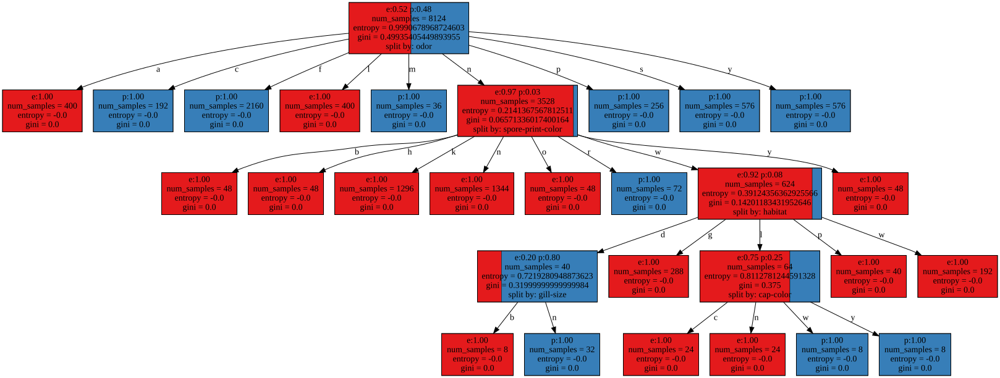

In [58]:
mushroom_tree = Tree(mushroom_df, criterion='gini')
mushroom_tree.draw()

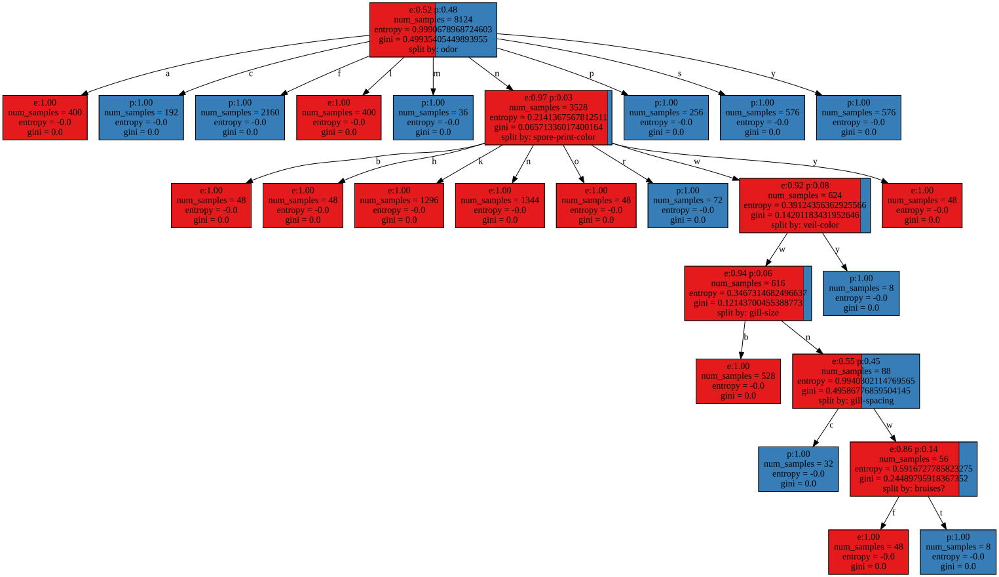

In [59]:
mushroom_tree = Tree(mushroom_df, criterion='infogain_ratio')
mushroom_tree.draw()

In [17]:
mushroom_train_df, mushroom_test_df = train_test_split(mushroom_df, test_size=0.3333)

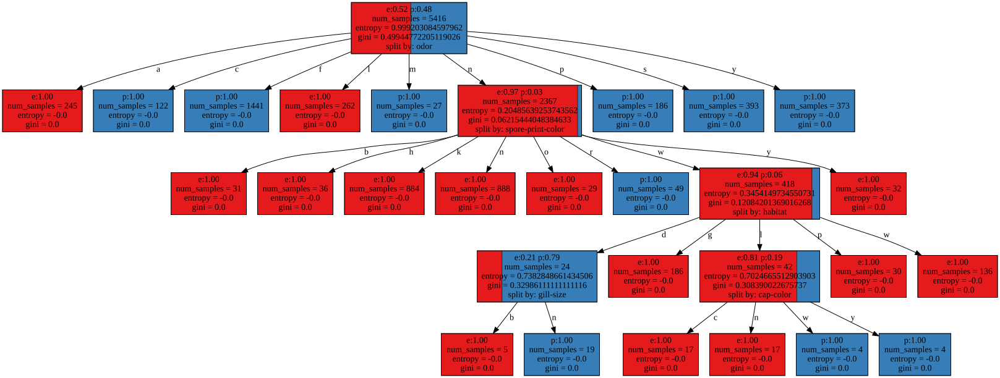

In [18]:
mushroom_test_tree = Tree(mushroom_train_df,criterion='gini')
mushroom_test_tree.draw()

In [19]:
get_err_of_tree(mushroom_test_tree,mushroom_test_df)

0.0

In [20]:
cm(mushroom_test_tree,mushroom_test_df)

array([[1410.,    0.],
       [   0., 1298.]])

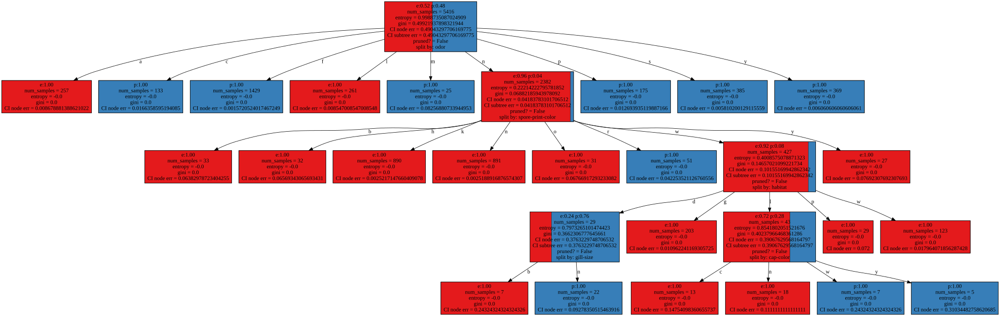

In [69]:
mushroom_test_pruned_tree = Tree(mushroom_train_df,criterion='gini')
mushroom_test_pruned_tree = CI_pruning(mushroom_test_pruned_tree,1.5)
mushroom_test_pruned_tree.draw()

In [70]:
get_err_of_tree(mushroom_test_pruned_tree,mushroom_test_df)

0.0

In [71]:
cm(mushroom_test_pruned_tree,mushroom_test_df)

array([[1315.,    0.],
       [   0., 1393.]])

# Zadanie 5
Zbiór danych Car Evaluation (http://archive.ics.uci.edu/ml/datasets/Car+Evaluation) zawiera
informacje o samochodach i rekomendacje dotyczącą ich ewentualnego kupna. Zapoznaj się z tym
zbiorem danych i stwórz dla niego drzewo decyzyjne.

In [72]:
url = "http://archive.ics.uci.edu/ml/machine-learning-databases/car/car.data"
columns = ['buying','maint','doors','persons','lug_boot','safety','target']
car_df = pd.read_csv(url, header=None,names=columns)
car_df['doors'] = np.array([int(i) if len(i) == 1 else int(i[0]) for i in car_df['doors']])
car_df['persons'] = np.array([int(i) if len(i) == 1 else 5 for i in car_df['persons']])
car_df.head()

,buying,maint,doors,persons,lug_boot,safety,target
0,vhigh,vhigh,2,2,small,low,unacc
1,vhigh,vhigh,2,2,small,med,unacc
2,vhigh,vhigh,2,2,small,high,unacc
3,vhigh,vhigh,2,2,med,low,unacc
4,vhigh,vhigh,2,2,med,med,unacc


In [73]:
car_train_df, car_test_df = train_test_split(car_df, test_size=0.3333)

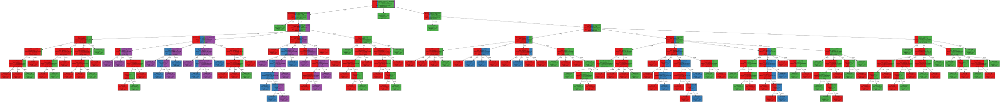

In [74]:
car_test_tree = Tree(car_train_df,criterion='gini')
car_test_tree.draw()

In [75]:
get_err_of_tree(car_test_tree,car_test_df)

0.05381944444444445

In [76]:
cm(car_test_tree,car_test_df)

array([[122.,  16.,   4.,   0.],
       [  4., 386.,   0.,   3.],
       [  0.,   0.,  15.,   1.],
       [  2.,   0.,   1.,  22.]])

0.2361111111111111
[[ 79.  63.   0.   0.]
 [ 32. 361.   0.   0.]
 [ 16.   0.   0.   0.]
 [ 12.  13.   0.   0.]]


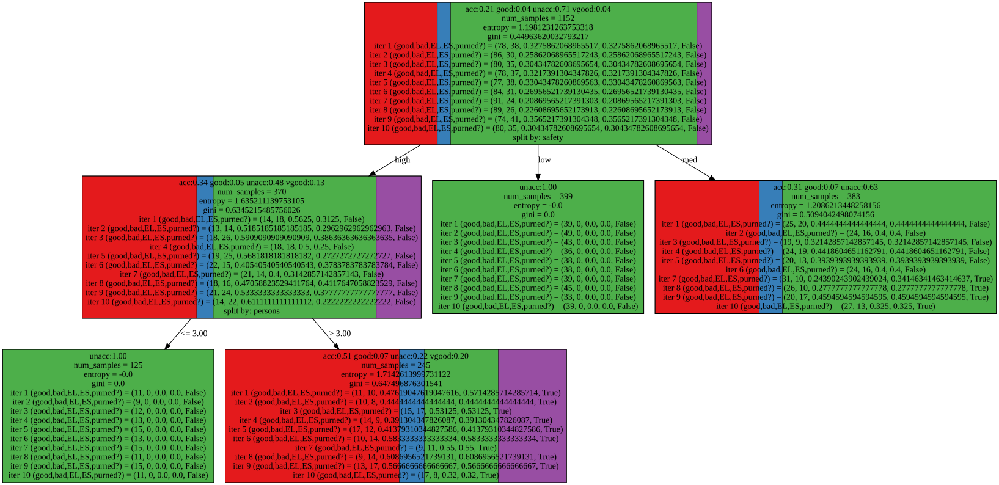

In [78]:
car_test_pruned_tree = Tree(car_train_df,criterion='gini')
car_test_pruned_tree = reduced_error_rate_pruning(car_test_pruned_tree,car_train_df)
print(get_err_of_tree(car_test_pruned_tree,car_test_df))
print(cm(car_test_pruned_tree,car_test_df))
car_test_pruned_tree.draw()

0.2361111111111111
[[ 79.  63.   0.   0.]
 [ 32. 361.   0.   0.]
 [ 16.   0.   0.   0.]
 [ 12.  13.   0.   0.]]


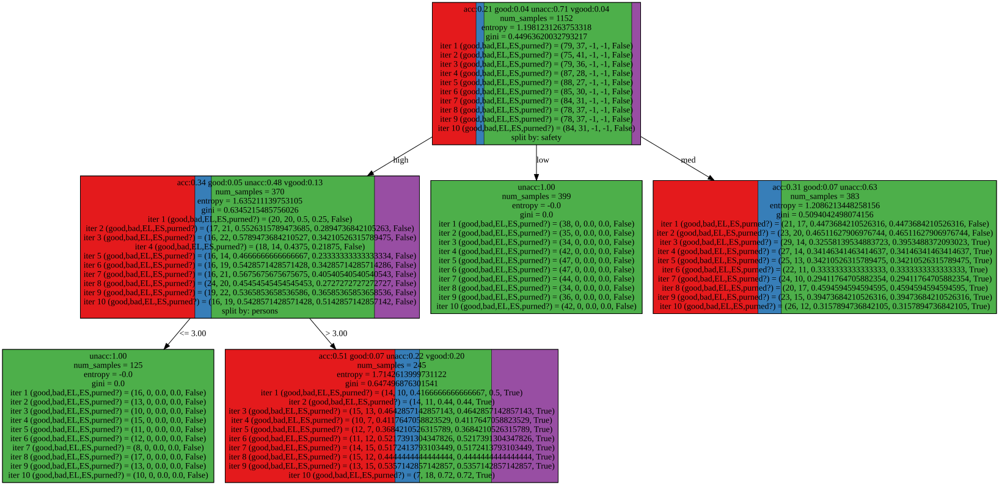

In [80]:
car_test_pruned_tree = Tree(car_train_df,criterion='gini')
car_test_pruned_tree = reduced_error_rate_pruning(car_test_pruned_tree,car_train_df,0)
print(get_err_of_tree(car_test_pruned_tree,car_test_df))
print(cm(car_test_pruned_tree,car_test_df))
car_test_pruned_tree.draw()

0.3177083333333333
[[  0. 142.   0.   0.]
 [  0. 393.   0.   0.]
 [  0.  16.   0.   0.]
 [  0.  25.   0.   0.]]


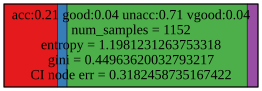

In [81]:
car_test_pruned_tree = Tree(car_train_df,criterion='gini')
car_test_pruned_tree = CI_pruning(car_test_pruned_tree,2)
print(get_err_of_tree(car_test_pruned_tree,car_test_df))
print(cm(car_test_pruned_tree,car_test_df))
car_test_pruned_tree.draw()

# Zadanie 6
Zbiór danych Bank Marketing (http://archive.ics.uci.edu/ml/datasets/Bank+Marketing) zawiera
informacje o klientach banku i ich zainteresowaniu lokatami bankowymi. Zapoznaj się z tym
zbiorem danych i na jego podstawie stwórz drzewo decyzyjne pozwalające przewidywać czy klient
banku będzie zainteresowany lokatami czy nie na podstawie zgromadzonych o nim informacji. 

In [82]:
bank_df = pd.read_csv('bank-full.csv',sep=';')
bank_df = bank_df.rename(columns={'y':'target'})
bank_df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [83]:
mode = bank_df.mode()

In [84]:
bank_df = bank_df.drop('poutcome',axis = 1)
for column in bank_df.columns[:-1]:
    bank_df[column] = np.array([e if e != 'unknown' else mode[column][0] for e in bank_df[column]])
bank_df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,target
0,58,management,married,tertiary,no,2143,yes,no,cellular,5,may,261,1,-1,0,no
1,44,technician,single,secondary,no,29,yes,no,cellular,5,may,151,1,-1,0,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,cellular,5,may,76,1,-1,0,no
3,47,blue-collar,married,secondary,no,1506,yes,no,cellular,5,may,92,1,-1,0,no
4,33,blue-collar,single,secondary,no,1,no,no,cellular,5,may,198,1,-1,0,no


In [85]:
bank_train_df, bank_test_df = train_test_split(bank_df, test_size=0.4)

In [86]:
bank_tree = Tree(bank_train_df)

In [87]:
d = bank_tree.draw()

In [88]:
d

In [120]:
d.render(filename='g1.dot')

'g1.dot.pdf'

In [89]:
get_err_of_tree(bank_tree,bank_test_df)

0.13005252972076306

In [90]:
cm(bank_tree,bank_test_df)

array([[  951.,  1186.],
       [ 1166., 14782.]])

In [91]:
bank_tree_1 = copy.deepcopy(bank_tree)

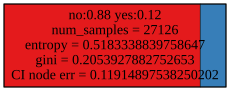

In [92]:
CI_pruning(bank_tree_1,1.5)
bank_tree_1.draw()

In [93]:
d2 = bank_tree_1.draw()
d2.render(filename='g2.dot')

'g2.dot.pdf'

In [94]:
get_err_of_tree(bank_tree_1,bank_test_df)

0.1181642244954382

In [95]:
cm(bank_tree_1,bank_test_df)

array([[    0.,  2137.],
       [    0., 15948.]])

In [96]:
bank_tree_2 = copy.deepcopy(bank_tree)

In [97]:
reduced_error_rate_pruning(bank_tree_2,bank_train_df)

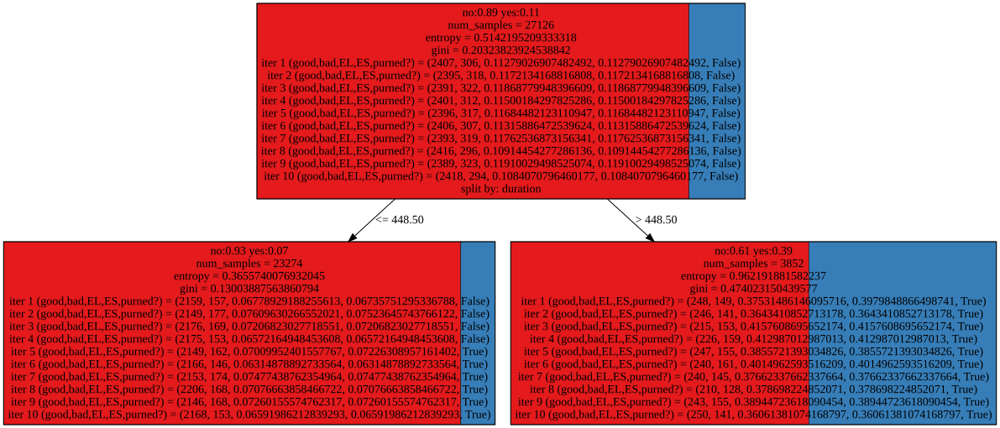

In [148]:
bank_tree_2.draw()

In [98]:
get_err_of_tree(bank_tree_2,bank_test_df)

0.1181642244954382

In [99]:
cm(bank_tree_2,bank_test_df)

array([[    0.,  2137.],
       [    0., 15948.]])

In [151]:
d3 = bank_tree_2.draw()
d3.render(filename='g3.dot')

'g3.dot.pdf'

In [100]:
bank_tree_3 = copy.deepcopy(bank_tree)

In [101]:
reduced_error_rate_pruning(bank_tree_3,bank_train_df,mode=0)

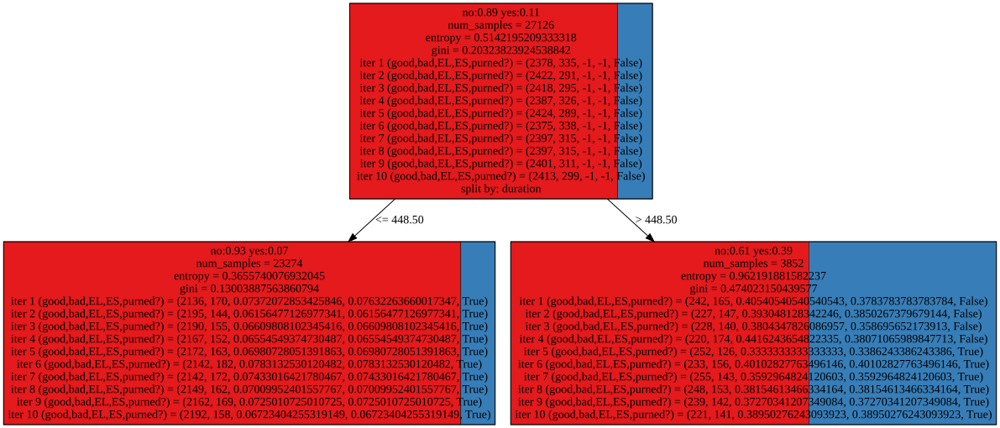

In [154]:
bank_tree_3.draw()

In [102]:
bank_tree_4 = copy.deepcopy(bank_tree)

In [103]:
bank_tree_4.pruning_precuting(150)

In [104]:
get_err_of_tree(bank_tree_4,bank_test_df)

0.10627591927011336

In [105]:
cm(bank_tree_4,bank_test_df)

array([[  939.,  1198.],
       [  724., 15224.]])

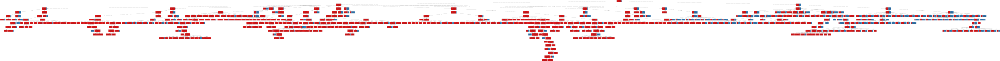

In [175]:
d4 = bank_tree_4.draw()
d4

In [176]:
d4.render(filename='g4.dot')

'g4.dot.pdf'

# Zadanie 7 ( bonusowe)
Zapoznaj się ze zbiorem danych Human Activity Recognition Using Smartphones
(http://archive.ics.uci.edu/ml/datasets/Human+Activity+Recognition+Using+Smartphones). Spróbuj
stworzyć klasyfikator, który będzie rozpoznawał czynność wykonywaną przez człowieka na
podstawie odczytów sensorów określonych w zestawie danych. 

In [106]:
features = pd.read_csv('features.txt', delim_whitespace=True, header=None)
train_data = pd.read_csv('X_train.txt', delim_whitespace=True, names=features[1].ravel())
train_data['target'] = pd.read_csv('y_train.txt', delim_whitespace=True, header=None)
test_data = pd.read_csv('X_test.txt', delim_whitespace=True, names=features[1].ravel())
test_data['target'] = pd.read_csv('y_test.txt', delim_whitespace=True, header=None)

train_data.head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",target
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,5
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,5
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,5
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,5
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,5


In [107]:
RF = RandomForestClassifier(n_estimators=20, max_depth=13, min_samples_split=10)

In [108]:
Y_train = train_data['target']
X_train = train_data.drop('target',axis=1)
RF.fit(X_train,Y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=13, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [109]:
Y_test = test_data['target']
X_test = test_data.drop('target',axis=1)

In [110]:
from sklearn.metrics import confusion_matrix
preds = RF.predict(X_test)
conf_mat = confusion_matrix(np.array(Y_test), preds)
print(conf_mat)

[[482   5   9   0   0   0]
 [ 48 416   7   0   0   0]
 [ 18  44 358   0   0   0]
 [  0   0   0 426  65   0]
 [  0   0   0  39 493   0]
 [  0   0   0   0   0 537]]


In [111]:
RF.score(X_test,Y_test)

0.9202578893790295

In [112]:
ETC = ExtraTreesClassifier(n_estimators=30, min_samples_split=20, max_leaf_nodes=15)
ETC.fit(X_train,Y_train)
ETC.score(X_test,Y_test)

0.8452663725822871

In [113]:
from sklearn.metrics import confusion_matrix
preds = ETC.predict(X_test)
conf_mat = confusion_matrix(np.array(Y_test), preds)
print(conf_mat)

[[484   1  11   0   0   0]
 [ 50 414   7   0   0   0]
 [ 93  62 265   0   0   0]
 [  0   2   0 263 221   5]
 [  0   0   0   4 528   0]
 [  0   0   0   0   0 537]]


In [114]:
preds = KNN(np.array(X_train),np.array(Y_train),np.array(X_test),[3,4,5,6,7])

In [115]:
err_rates(preds,np.array(Y_test))

{3: 0.10926365795724466,
 4: 0.10892432982694265,
 5: 0.09840515778758059,
 6: 0.0987444859178826,
 7: 0.09670851713607058}

In [118]:
for k,pred in preds.items():
    print(k)
    conf_mat = confusion_matrix(np.array(Y_test), pred)
    print(conf_mat)
    

3
[[481   4  11   0   0   0]
 [ 36 422  13   0   0   0]
 [ 49  42 329   0   0   0]
 [  0   3   0 383 105   0]
 [  0   0   0  57 475   0]
 [  0   0   0   1   1 535]]
4
[[486   1   9   0   0   0]
 [ 44 420   7   0   0   0]
 [ 58  53 309   0   0   0]
 [  0   3   0 420  68   0]
 [  0   0   0  74 458   0]
 [  0   0   0   3   1 533]]
5
[[485   2   9   0   0   0]
 [ 40 424   7   0   0   0]
 [ 45  45 330   0   0   0]
 [  0   3   0 389  99   0]
 [  0   0   0  37 495   0]
 [  0   0   0   2   1 534]]
6
[[486   1   9   0   0   0]
 [ 45 421   5   0   0   0]
 [ 55  44 321   0   0   0]
 [  0   4   0 420  67   0]
 [  0   0   0  57 475   0]
 [  0   0   0   3   1 533]]
7
[[482   3  11   0   0   0]
 [ 42 423   6   0   0   0]
 [ 48  40 332   0   0   0]
 [  0   4   0 394  93   0]
 [  0   0   0  35 497   0]
 [  0   0   0   2   1 534]]
